# Migração de pinguins

## Importando bibliotecas

In [38]:
import pandas as pd
import plotly.express as px
import seaborn as sns

In [39]:
# Cria um dataframe e seleciona os dados necessários à análise
penguins = pd.read_csv('penguins.csv').drop(columns=['Unnamed: 0', 'year'])
penguins.head()

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,female


## Pinguins sem anotações

In [40]:
# Filtra a quantidade de dados faltantes em cada coluna
has_missing = penguins.isna().sum().reset_index()
has_missing

,index,0
0,species,0
1,island,0
2,bill_length_mm,2
3,bill_depth_mm,2
4,flipper_length_mm,2
5,body_mass_g,2
6,sex,11


In [41]:
# Visualização
fig = px.bar(has_missing, 
             x='index', y=0,
             labels={'index': 'Coluna', '0': 'Quantidade de faltantes'},
             title='Dados Faltantes por Coluna',
             color=0)
fig.update_layout(showlegend=False)
fig.show()

## De onde os pinguins mais vieram

In [42]:
# Filtra a contagem de pinguins por ilha
island_counts = penguins['island'].value_counts().reset_index()

In [43]:
# Visualização
fig = px.pie(island_counts, 
             values='count', 
             names='island',
             title='Distribuição de Pinguins por Ilha',
             color_discrete_sequence=px.colors.qualitative.Pastel
            )
fig.show()

## Espécies mais presentes

In [44]:
# Filtra a quantiadade de espécies analisadas
species_counts = penguins['species'].value_counts().reset_index()

In [45]:
# Visualização
fig = px.bar(species_counts, 
             x='species', y='count',
             title='Contagem de Pinguins por Espécie',
             labels={'species': 'Espécie', 'count': 'Quantidade'},
             color='species',
             text='count')
fig.update_traces(textposition='outside')
fig.show()

## Relação entre as medidas do pinguim e sua espécie

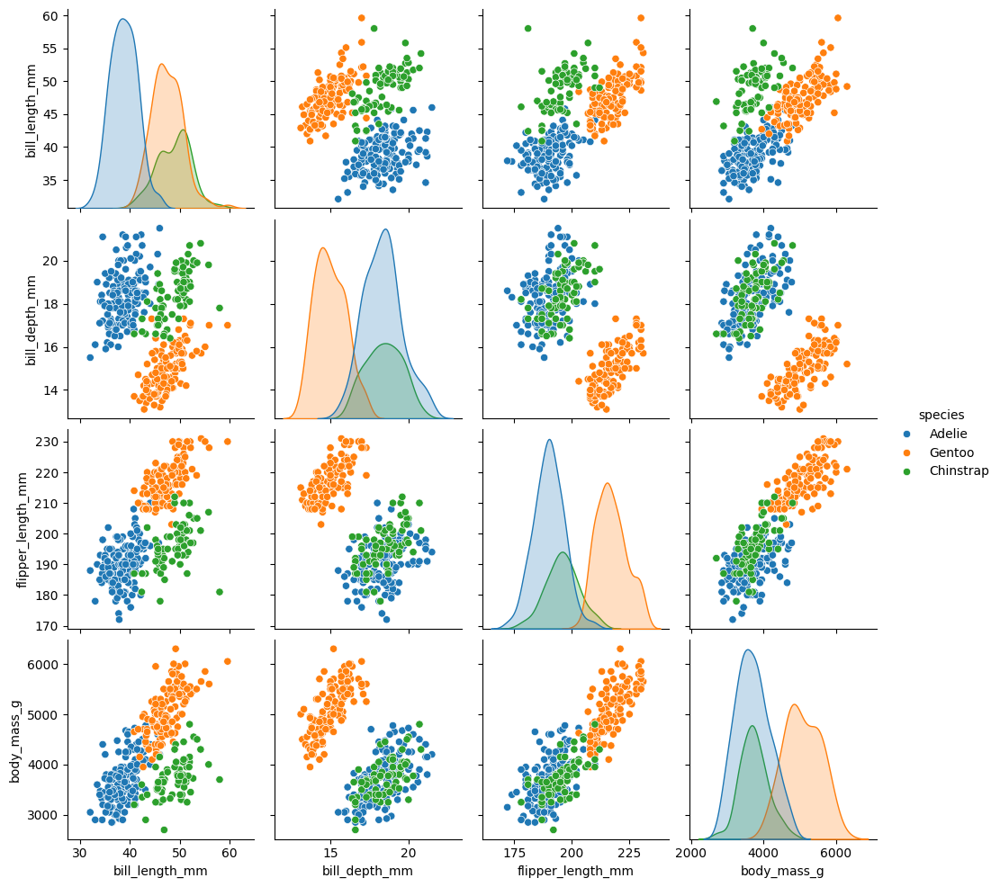

In [46]:
# Visualização de relações multivariadas
sns.pairplot(penguins, hue='species')

## Relação entre medidas e sexo para cada espécie

In [49]:
# Filtra os dados de sexo para cada espécie
adelie = penguins[penguins['species'] == 'Adelie']
gentoo = penguins[penguins['species'] == 'Gentoo']
chinstrap = penguins[penguins['species'] == 'Chinstrap']

### Adelie

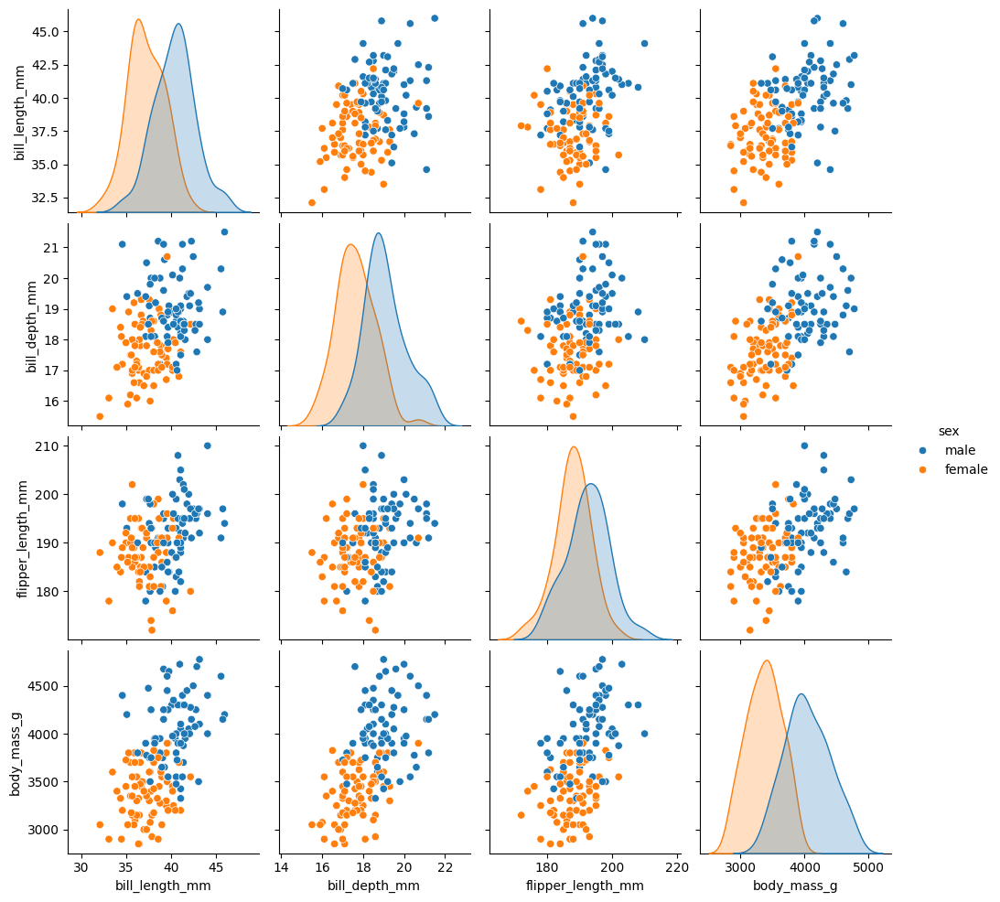

In [54]:
# Visualização de relações multivariadas
sns.pairplot(adelie, hue='sex')

### Gentoo

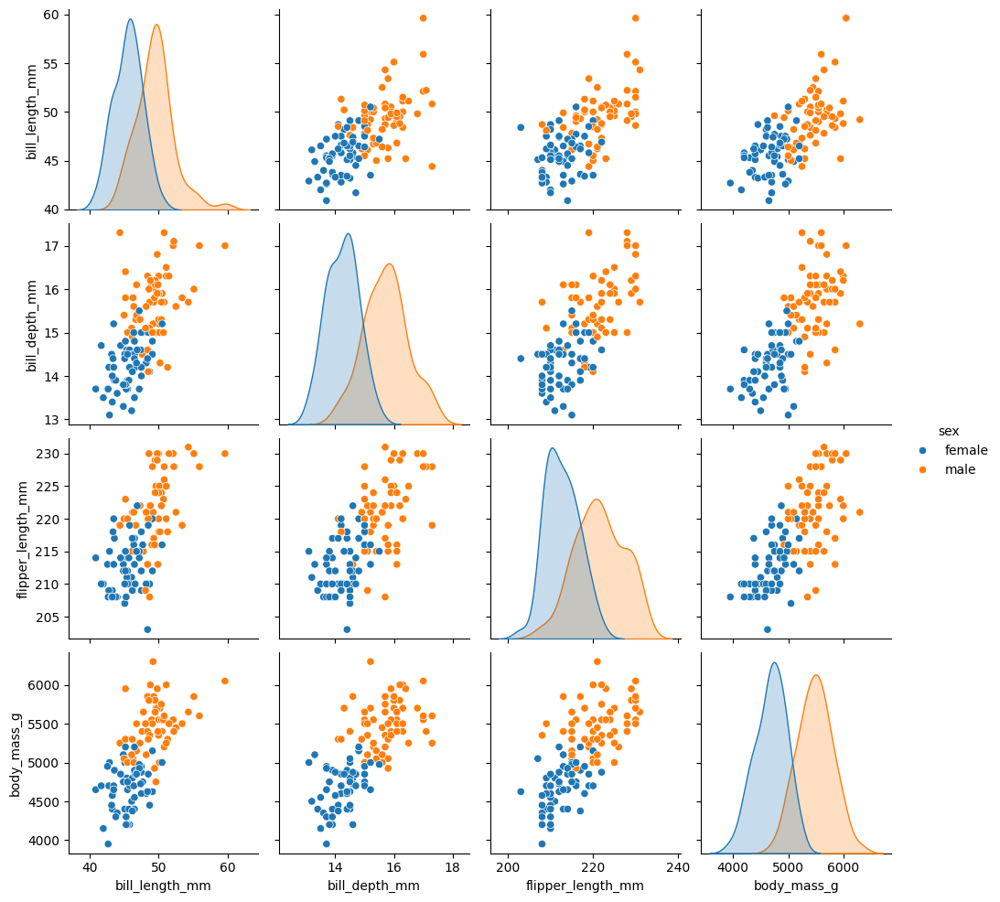

In [55]:
# Visualização de relações multivariadas
sns.pairplot(gentoo, hue='sex')

### Chinstrap

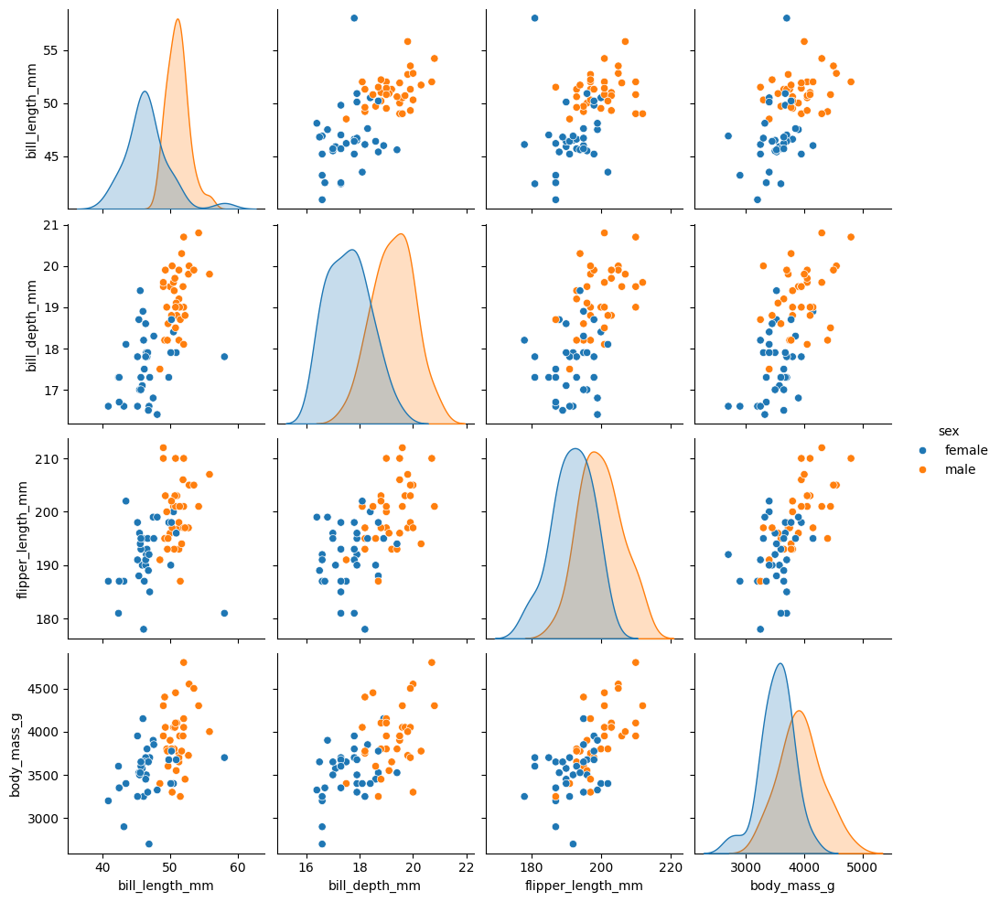

In [58]:
# Visualização de relações multivariadas
sns.pairplot(chinstrap, hue='sex')